In [1]:
%matplotlib inline
from spectral_cube import SpectralCube
from signal_id.utils import get_pixel_scales
from astropy import units as u
import matplotlib.pyplot as p
import seaborn as sns
sns.set_context('talk')
import numpy as np
import os

from scipy import ndimage as nd
import skimage.morphology as mo
from skimage.filters import threshold_adaptive


In [2]:
data_path = "/media/eric/Data_3/VLA/IC1613/"

cube = SpectralCube.read(os.path.join(data_path, "IC1613_NA_ICL001.fits"))

# Remove empty channels
cube = cube[38:65, 600:1500, 500:1600]

/home/eric/anaconda/lib/python2.7/site-packages/APLpy-2.0.dev841-py2.7.egg/aplpy/labels.py:432: UnicodeWarning: Unicode equal comparison failed to convert both arguments to Unicode - interpreting them as being unequal
  if self.coord == x or self.axis.apl_tick_positions_world[ipos] > 0:
INFO:astropy:Auto-setting vmin to -2.416e-03
INFO:astropy:Auto-setting vmax to  1.017e-02


INFO: Auto-setting vmin to -2.416e-03 [aplpy.core]
INFO: Auto-setting vmax to  1.017e-02 [aplpy.core]


/home/eric/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:590: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors == str('face'):


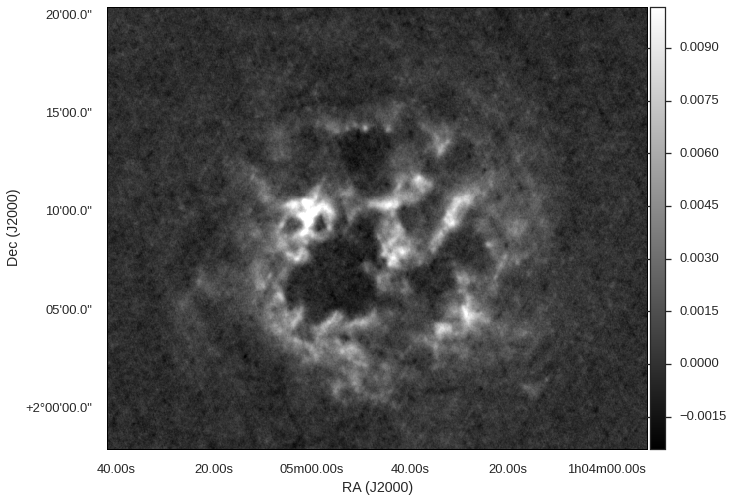

In [3]:
cube[15, :, :].quicklook()

In [4]:
import cv2

from basics.bubble_segment import beam_struct

In [5]:
def return_bths(array, scales, beam, wcs, min_scale=2):

    # In deg/pixel
    # pixscale = get_pixel_scales(wcs) * u.deg
    pixscale = np.abs(wcs.pixel_scale_matrix[0, 0])

    struct_orig, beam_orig = \
        beam_struct(beam, min_scale, pixscale, return_beam=True)

    output_bths = np.empty((len(scales),)+array.shape)
        
    # Black tophat
    array = array.astype("float64")
    for i, scale in enumerate(scales):
        struct = beam_struct(beam, scale, pixscale).astype("uint8")
        output_bths[i] = cv2.morphologyEx(array, cv2.MORPH_BLACKHAT, struct)
    
    return output_bths

In [6]:
scales = np.arange(3, 31, 2)

output_bths = return_bths(cube[15, :, :].value, scales, cube.beam, cube.wcs)

/home/eric/Dropbox/code_development/radio_astro_tools/radio_beam/radio_beam/beam.py:467: UserWarning: as_tophat_kernel is not aware of any misaligment  between pixel and world coordinates
  warnings.warn("as_tophat_kernel is not aware of any misaligment "


In [7]:
normed = np.empty_like(output_bths)

for i in range(normed.shape[0]):
    mean = np.mean(output_bths[i])
    std = np.std(output_bths[i])
    normed[i] = (output_bths[i]-mean)/std

<matplotlib.colorbar.Colorbar instance at 0x7f11e8d8f098>

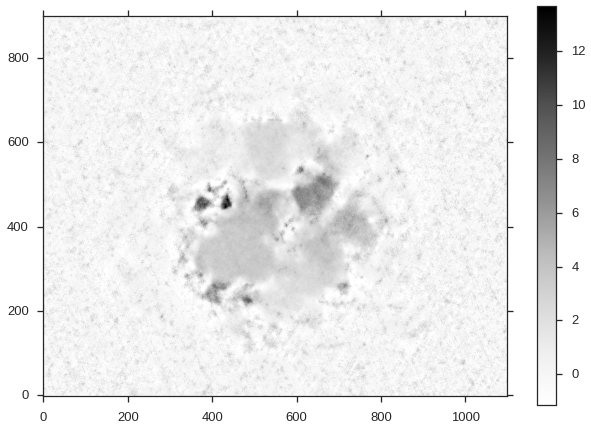

In [8]:
p.imshow(normed.max(0), origin='lower')
p.colorbar()

In [9]:
pixscale = np.abs(cube.wcs.pixel_scale_matrix[0, 0])
beam_sizes = [int(np.floor(beam_struct(cube.beam, scale, pixscale, return_beam=True)[1].major.value/pixscale)) for scale in scales]

In [10]:
beam_sizes

[26, 43, 61, 79, 96, 114, 131, 149, 167, 184, 202, 219, 237, 255]

In [11]:
orig_struct = beam_struct(cube.beam, 2, pixscale)
size_thresh = (orig_struct>0).sum()

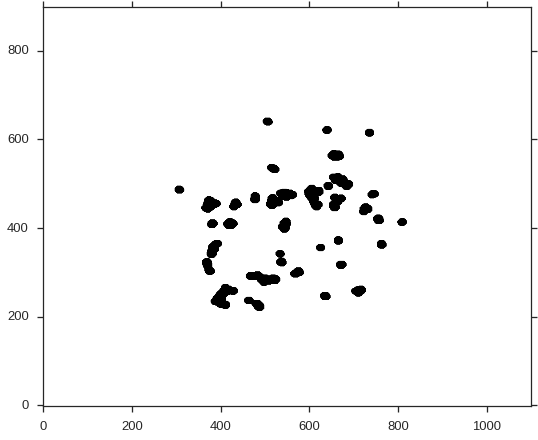

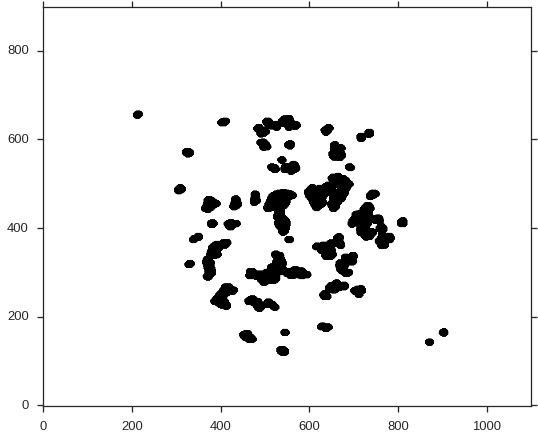

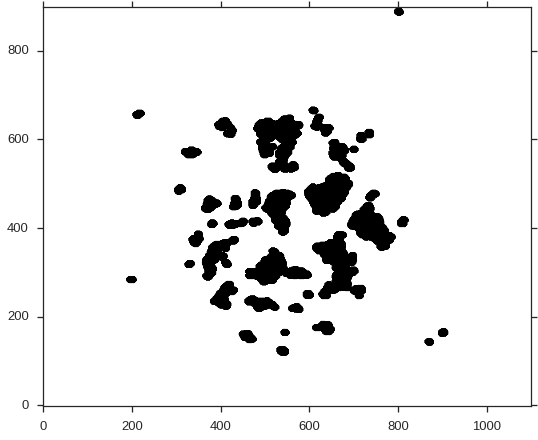

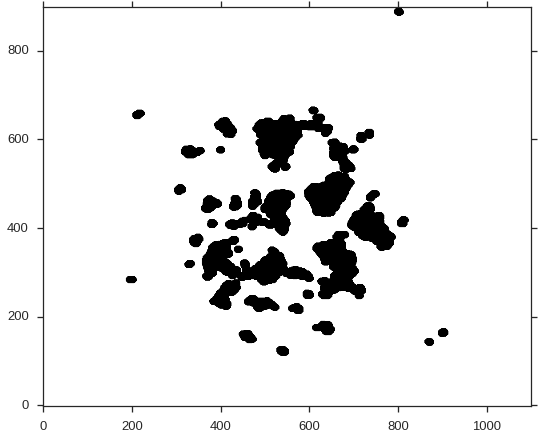

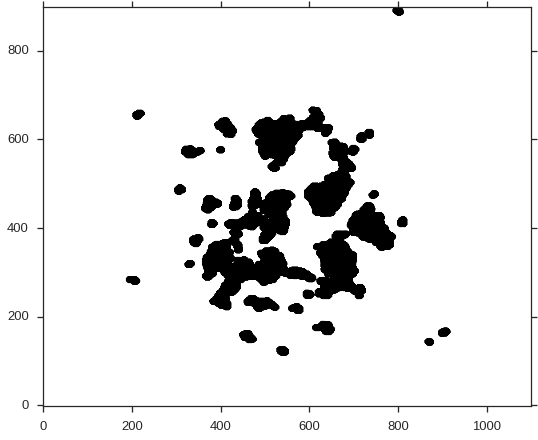

...

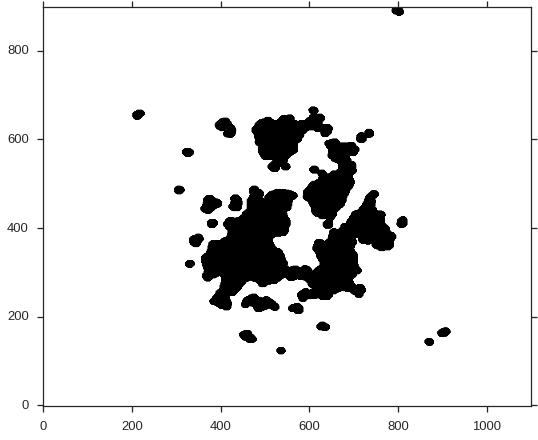

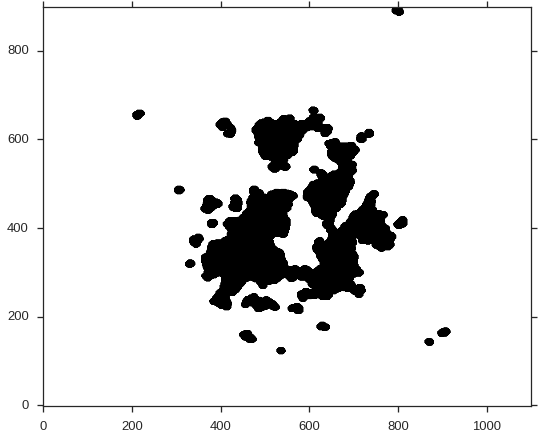

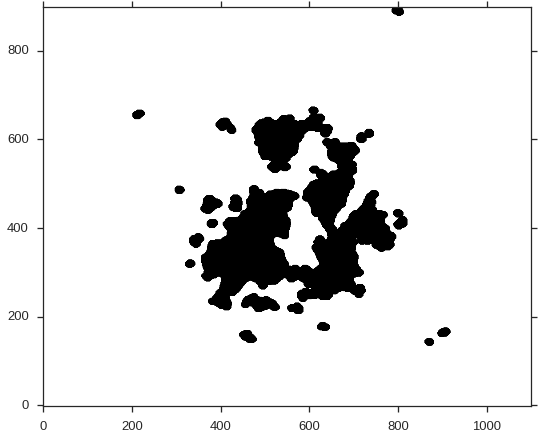

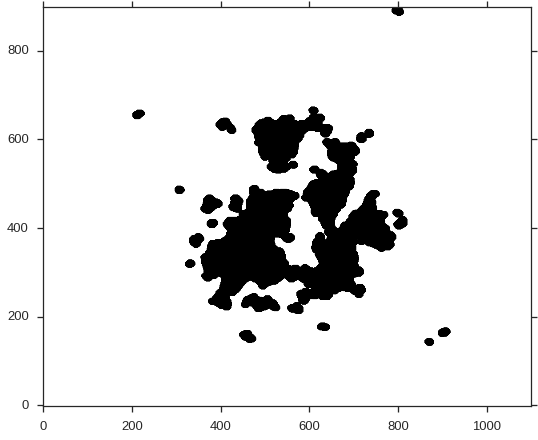

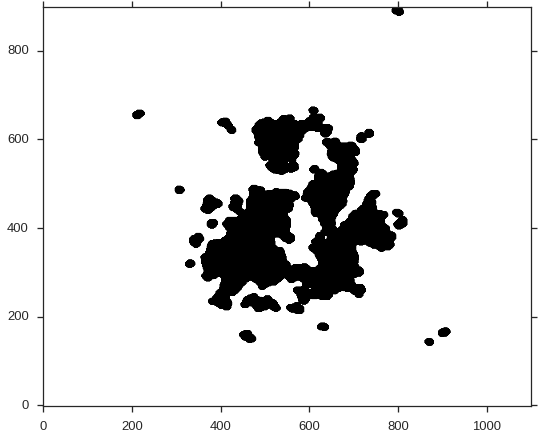

In [12]:
gray_mask = np.empty((900, 1100))
for size in beam_sizes:
    mask = nd.binary_opening(threshold_adaptive(normed.max(0), size, param=size/2), structure=orig_struct)
    p.imshow(mask, origin='lower')
    p.show()
    gray_mask += mask.astype(int)

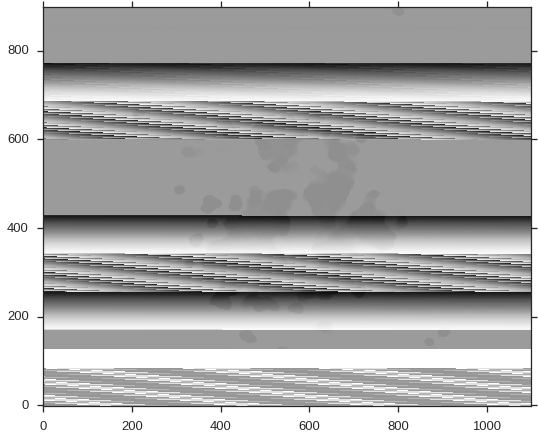

In [13]:
p.imshow(gray_mask, origin='lower')

In [14]:
from astrodendro import Dendrogram

In [15]:
d = Dendrogram.compute(nd.gaussian_filter(normed.max(0), 3), min_npix=size_thresh, min_value=2, min_delta=0.1)

In [16]:
tree = d.plotter()

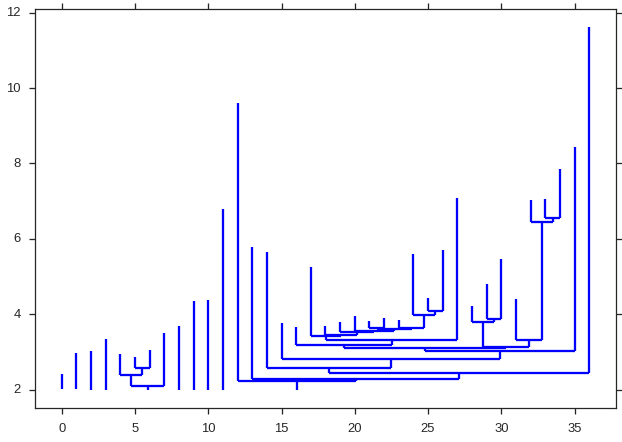

In [17]:
ax = p.subplot(111)
tree.plot_tree(ax)

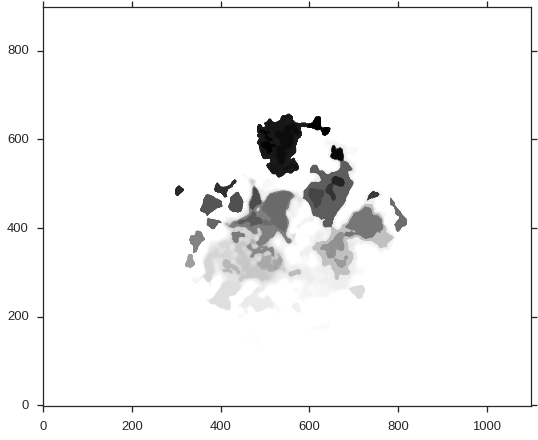

In [18]:
p.imshow(d.index_map, origin='lower')

/home/eric/anaconda/lib/python2.7/site-packages/matplotlib/collections.py:650: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if self._edgecolors_original != str('face'):


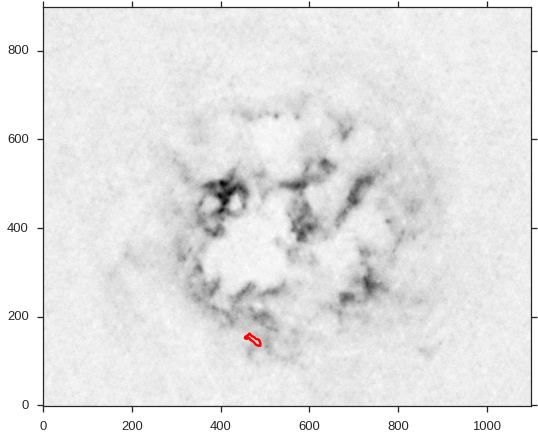

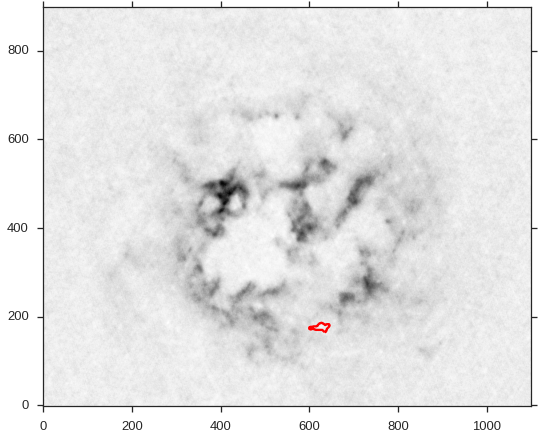

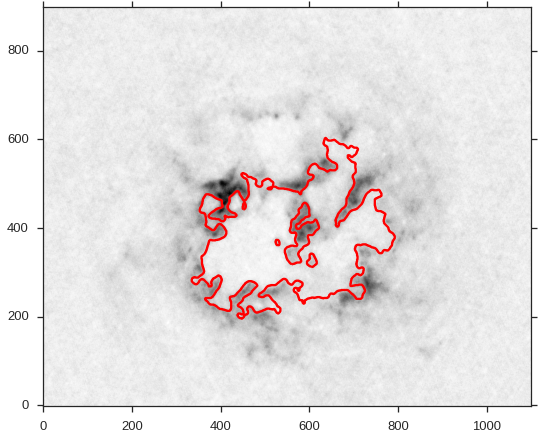

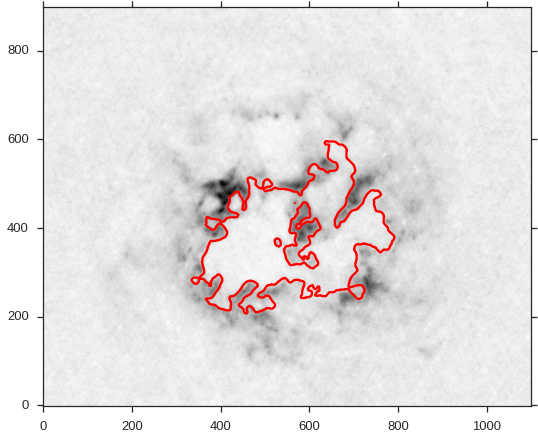

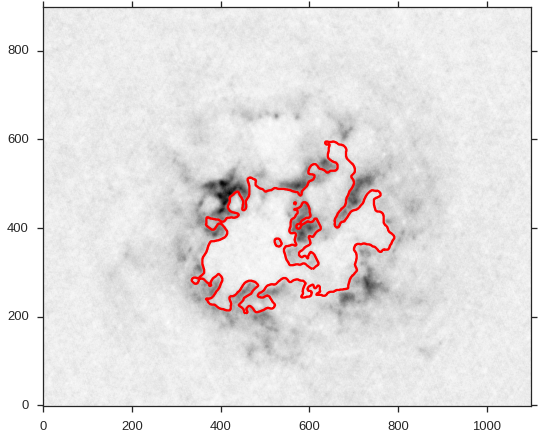

...

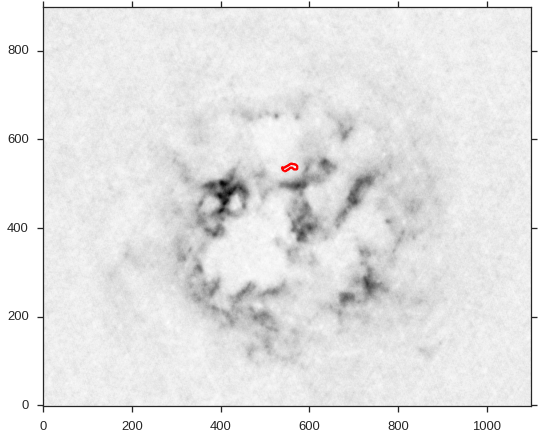

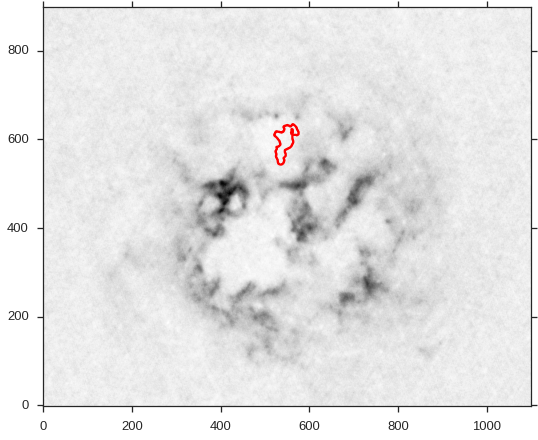

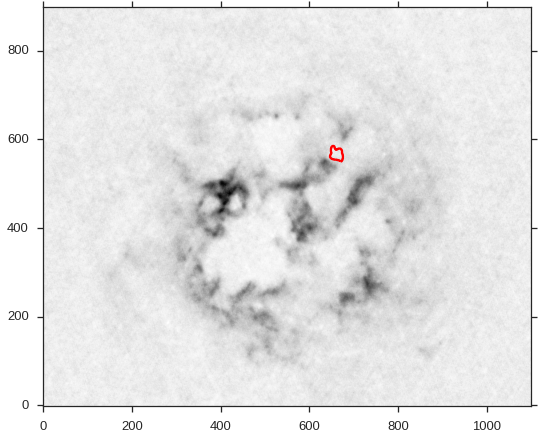

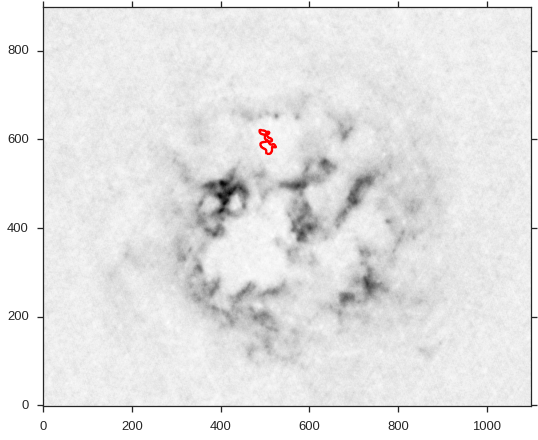

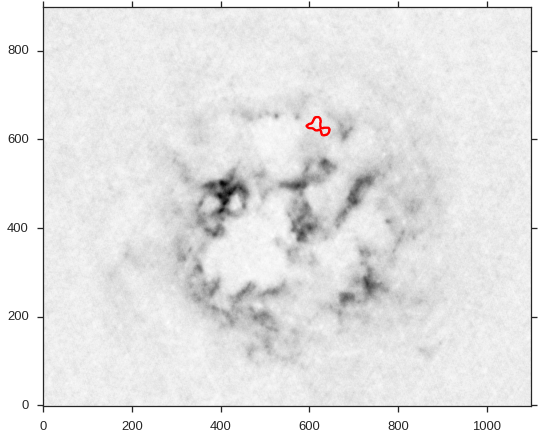

In [19]:
for i in range(len(d)):
    ax = p.subplot(111)
    ax.imshow(cube[15, :, :].value, origin='lower')
    tree.plot_contour(ax, structure=i, colors='r')
    p.show()